<a href="https://colab.research.google.com/github/gabrieldimas/machine-learning-study-2023/blob/main/ktp_ocr_1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [16]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
from google.colab import drive
from google.colab.patches import cv2_imshow
import glob
import imutils
from imutils import contours
import joblib

In [2]:
drive.mount('/content/drive')

Mounted at /content/drive


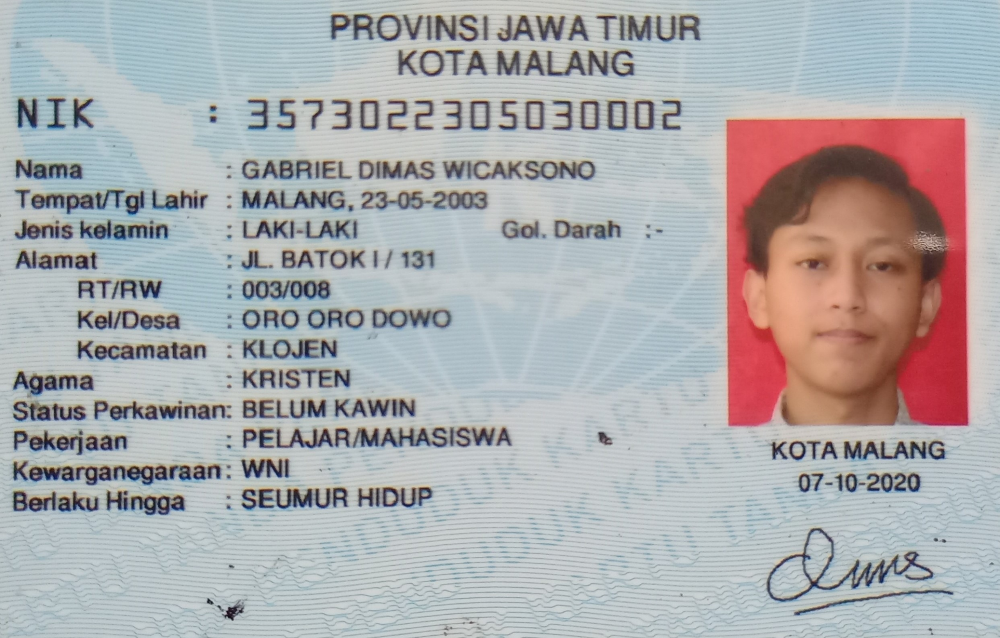

In [21]:
ori_img = cv2.imread('/content/drive/MyDrive/Kuliah/MachineLearning/Tubes/gabriel_ktp.jpg')
ori_img = imutils.resize(ori_img,width=2560)
cv2_imshow(ori_img)

In [22]:
def filter_image(img):
  gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
  clahe = cv2.createCLAHE(clipLimit=0.5, tileGridSize=(12, 12))
  clahed = clahe.apply(gray)
  gaussian = cv2.GaussianBlur(clahed,(3,3),0)
  median = cv2.medianBlur(gaussian,7)
  thresholded = cv2.threshold(median,165,255,cv2.THRESH_TRUNC + cv2.THRESH_OTSU)[1]
  binary = cv2.threshold(thresholded,127,255,cv2.THRESH_BINARY_INV)[1]

  return binary

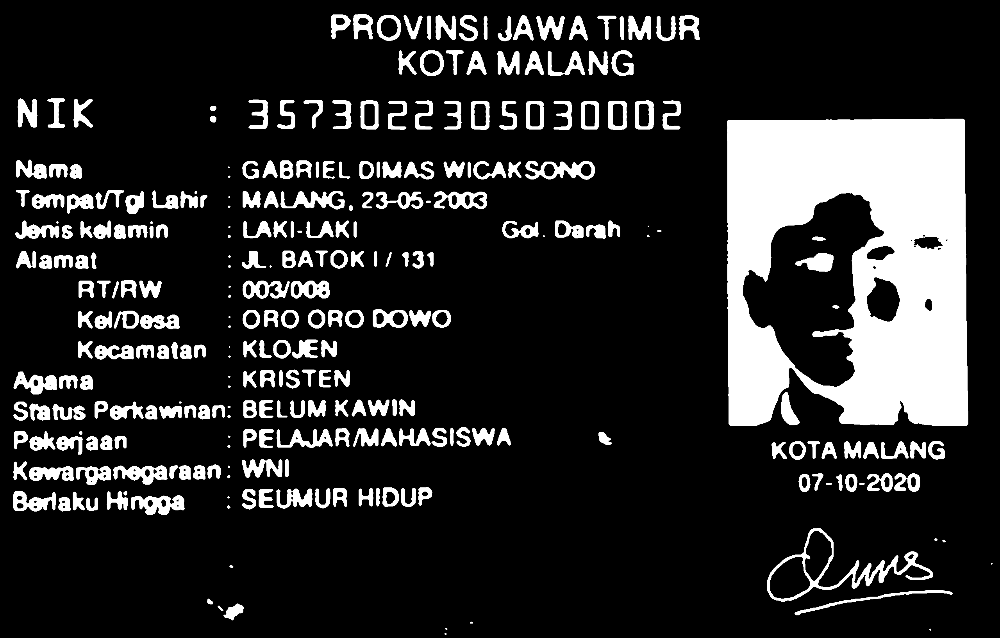

In [23]:
filtered_img = filter_image(ori_img.copy())
cv2_imshow(filtered_img)

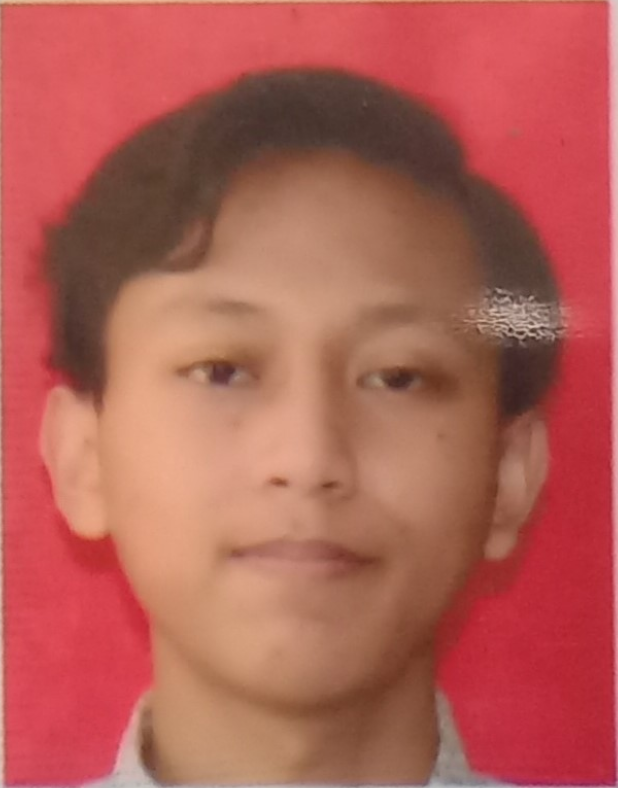

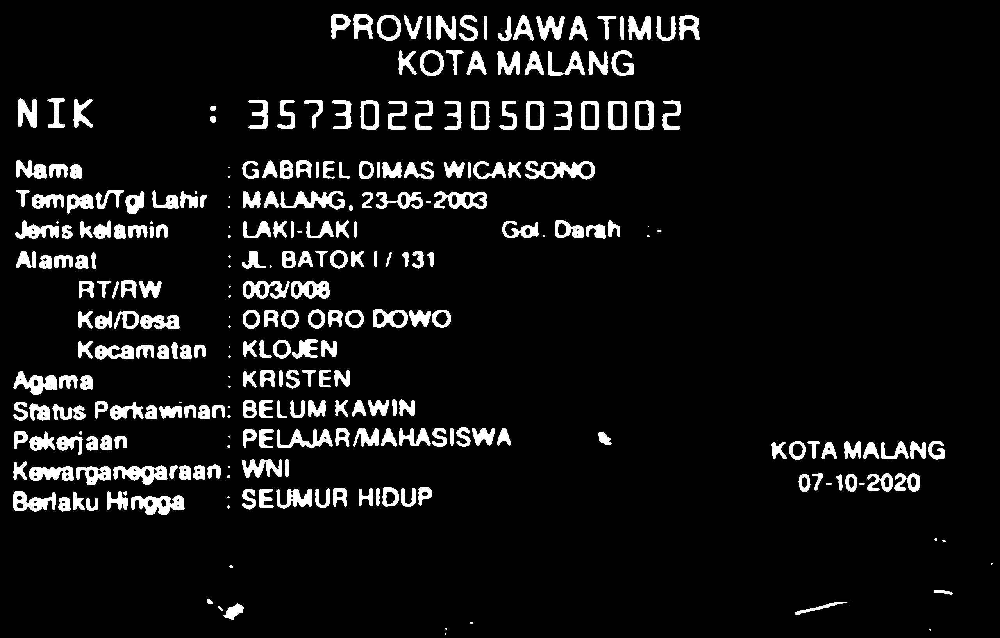

In [24]:
cnts = cv2.findContours(filtered_img, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
cnts = imutils.grab_contours(cnts)
cnts = contours.sort_contours(cnts, method="left-to-right")[0]


largest_areas = sorted(cnts, key=cv2.contourArea)
x, y, w, h = cv2.boundingRect(largest_areas[-1])
cv2.rectangle(filtered_img, (x, y), (x + w, y + h+30), (0, 0, 0), -1)
resized = imutils.resize(ori_img,width=2560)
foto_ktp = resized[y:y+h, x:x+w]

# remove big chunk
for cnt in cnts:
  x, y, w, h = cv2.boundingRect(cnt)
  if(w > 100 and  h > 100):
    cv2.rectangle(filtered_img, (x, y), (x + w, y + h), (0, 0, 0), -1)

cv2_imshow(foto_ktp)
cv2_imshow(filtered_img)



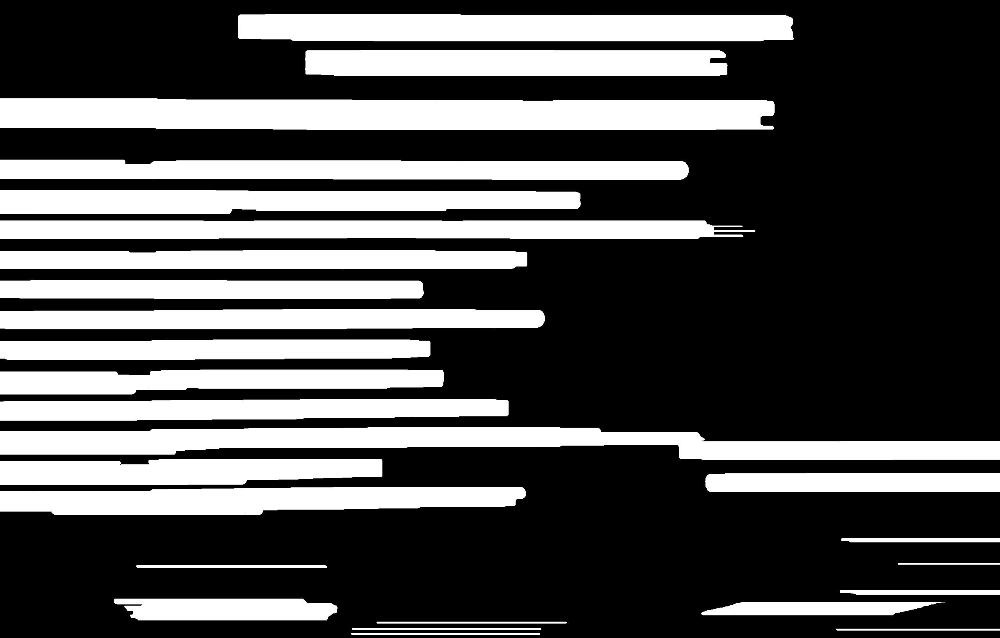

In [25]:
rect_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (480,1))
dilation = cv2.dilate(filtered_img, rect_kernel, iterations = 1)
cv2_imshow(dilation)

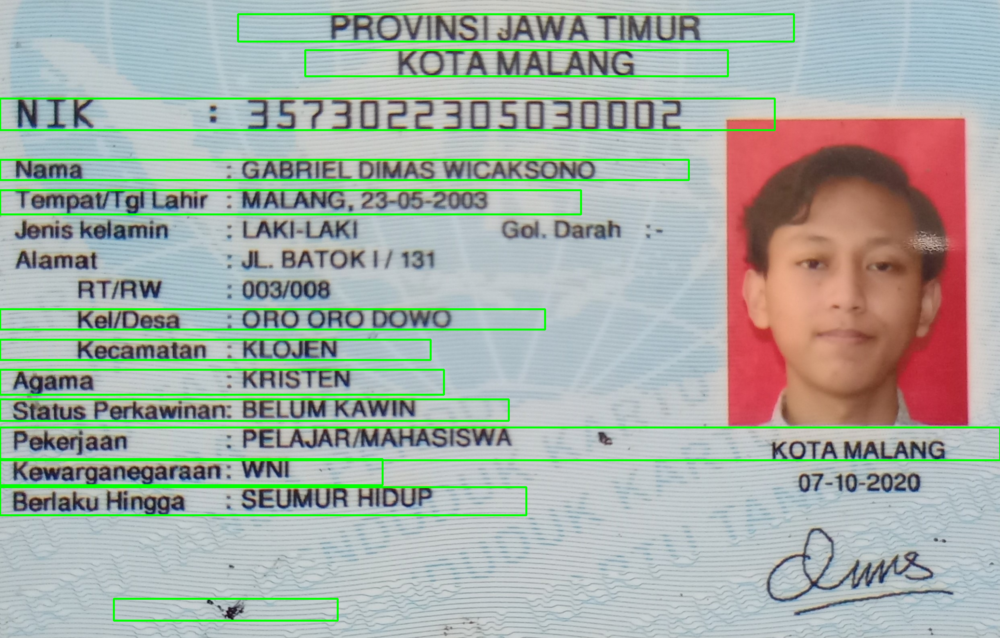

In [26]:
cnts = cv2.findContours(dilation, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
cnts = imutils.grab_contours(cnts)
cnts = contours.sort_contours(cnts, method="top-to-bottom")[0]
im2 = ori_img.copy()
ktp_roi=[]

for cnt in cnts:
        x, y, w, h = cv2.boundingRect(cnt)
        if(50 < w and 50 < h < 100):
          cv2.rectangle(im2, (x, y), (x + w, y + h), (0, 255, 0), 4)
          ktp_roi.append(filtered_img[y:y+h, x:x+w])
cv2_imshow(im2)

In [28]:
from tensorflow.keras.models import load_model

model_path = "/content/drive/MyDrive/Kuliah/MachineLearning/Tubes/network"

model = load_model(model_path)


# class_mapping = {
#     0: '0', 1: '1', 2: '2', 3: '3', 4: '4',
#     5: '5', 6: '6', 7: '7', 8: '8', 9: '9',
#     10: 'A', 11: 'B', 12: 'C', 13: 'D', 14: 'E',
#     15: 'F', 16: 'G', 17: 'H', 18: 'I', 19: 'J',
#     20: 'K', 21: 'L', 22: 'M', 23: 'N', 24: 'O',
#     25: 'P', 26: 'Q', 27: 'R', 28: 'S', 29: 'T',
#     30: 'U', 31: 'V', 32: 'W', 33: 'X', 34: 'Y', 35: 'Z'
# }
# class_mapping = [
#     '!', '"', '#', '$', '%', '&', "'", '(', ')', '*',
#     '+', ',', '-', '.', '/', '0', '1', '2', '3', '4',
#     '5', '6', '7', '8', '9', ':', ';', '<', '=', '>',
#     '?', '@', 'A', 'B', 'C', 'D', 'E', 'F', 'G', 'H',
#     'I', 'J', 'K', 'L', 'M', 'N', 'O', 'P', 'Q', 'R',
#     'S', 'T', 'U', 'V', 'W', 'X', 'Y', 'Z', 'W', 'X',
#     'Y', 'Z', '!', '"', 'a', 'b', 'c', 'd', "e", 'f',
#     'g', 'h', 'i', 'j', 'k', 'l', 'm', 'n', 'o', 'p',
#     'q', 'r', 's', 't', 'u', 'v', 'w', 'x', 'y', 'z',
#     '{', '|', '}', '~']

class_mapping = ['6',  'D',  'f',  '/',  'F',  'x',  'J',  '8',  'H',  'k',  '1',
                 'g',  '2',  'd',  '3',  't',  '.',  '4',  'o',  'y',  'A',
                 'u',  'G',  '-',  'm',  'W',  'c',  '9',  'N',  'P',  'X',
                  'h',  '7',  'j',  '5',  'b',  'w',  'l',  '0',  'I',  'Y',
                   ':',  'T',  'K',  'E',  'V',  'M',  'S',  'a',  'i',  'r',
                    'p',  'e',  'U',  's', 'C',  'q',  'n',  'B',  'z',  'v',
                     'O',  'R',  'Z',  'Q',  'L']
def get_text_roi(image):
  text_roi=[]
  cnts = cv2.findContours(image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
  cnts = imutils.grab_contours(cnts)
  cnts = contours.sort_contours(cnts, method="left-to-right")[0]

  for cnt in cnts:
        x, y, w, h = cv2.boundingRect(cnt)
        if(w > 4 and h > 20):
          padded = cv2.copyMakeBorder(image[y:y+h, x:x+w],20,20,20,20, cv2.BORDER_CONSTANT)


          padded = cv2.resize(padded,(28,28))
          # padded = 255 - padded
          cv2_imshow(padded)
          pad = np.array(padded)
          pad = pad / 255.0
          pad_vector = pad.reshape((-1, 1))
          padded = pad_vector.reshape(-1, 28, 28, 1)

          pred = model.predict(padded)
          pred_conf = np.amax(pred)
          pred_index = np.argmax(pred)
          print(f'model pred idx: {pred_index}')
          print(f'model pred conf: {pred_conf}')
          print(f'model pred label: {class_mapping[pred_index]}')
          text_roi.append(f'{class_mapping[pred_index]}')
  return text_roi

In [29]:
!sudo apt install tesseract-ocr
!pip install pytesseract

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following additional packages will be installed:
  tesseract-ocr-eng tesseract-ocr-osd
The following NEW packages will be installed:
  tesseract-ocr tesseract-ocr-eng tesseract-ocr-osd
0 upgraded, 3 newly installed, 0 to remove and 24 not upgraded.
Need to get 4,816 kB of archives.
After this operation, 15.6 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr-eng all 1:4.00~git30-7274cfa-1.1 [1,591 kB]
Get:2 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr-osd all 1:4.00~git30-7274cfa-1.1 [2,990 kB]
Get:3 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr amd64 4.1.1-2.1build1 [236 kB]
Fetched 4,816 kB in 1s (3,365 kB/s)
debconf: unable to initialize frontend: Dialog
debconf: (No usable dialog-like program is installed, so the dialog based frontend cannot be used. at /usr/share/perl5/Debc

In [30]:
def grab_text(ktp_roi,index):
  rect_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (40,40))
  dlt = cv2.dilate(ktp_roi, rect_kernel, iterations = 1)

  cnts = cv2.findContours(dlt, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
  cnts = imutils.grab_contours(cnts)
  cnts = contours.sort_contours(cnts, method="left-to-right")[0]
  x, y, w, h = cv2.boundingRect(cnts[index])

  return ktp_roi[y:y+h, x:x+w]

1/1 [==============================] - 3s 3s/step
model pred idx: 25
model pred conf: 0.9999542236328125
model pred label: W


1/1 [==============================] - 0s 121ms/step
model pred idx: 10
model pred conf: 0.8119749426841736
model pred label: 1


1/1 [==============================] - 0s 149ms/step
model pred idx: 0
model pred conf: 0.7078293561935425
model pred label: 6


1/1 [==============================] - 0s 66ms/step
model pred idx: 31
model pred conf: 0.994002640247345
model pred label: h


1/1 [==============================] - 0s 112ms/step
model pred idx: 1
model pred conf: 0.9719268083572388
model pred label: D


1/1 [==============================] - 0s 84ms/step
model pred idx: 23
model pred conf: 0.9999980926513672
model pred label: -


1/1 [==============================] - 0s 115ms/step
model pred idx: 28
model pred conf: 0.9622597098350525
model pred label: N


1/1 [==============================] - 0s 79ms/step
model pred idx: 1
model pred conf: 0.9751889109611511
model pred label: D


1/1 [==============================] - 0s 100ms/step
model pred idx: 19
model pred conf: 0.9959434866905212
model pred label: y


1/1 [==============================] - 0s 74ms/step
model pred idx: 10
model pred conf: 0.9999730587005615
model pred label: 1


1/1 [==============================] - 0s 52ms/step
model pred idx: 32
model pred conf: 0.9584472179412842
model pred label: 7


1/1 [==============================] - 0s 54ms/step
model pred idx: 10
model pred conf: 0.9990757703781128
model pred label: 1


1/1 [==============================] - 0s 42ms/step
model pred idx: 29
model pred conf: 0.9998216032981873
model pred label: P


1/1 [==============================] - 0s 30ms/step
model pred idx: 1
model pred conf: 0.7624695897102356
model pred label: D


1/1 [==============================] - 0s 17ms/step
model pred idx: 23
model pred conf: 0.7306483387947083
model pred label: -


1/1 [==============================] - 0s 17ms/step
model pred idx: 30
model pred conf: 0.9990859031677246
model pred label: X


1/1 [==============================] - 0s 19ms/step
model pred idx: 10
model pred conf: 0.45045819878578186
model pred label: 1


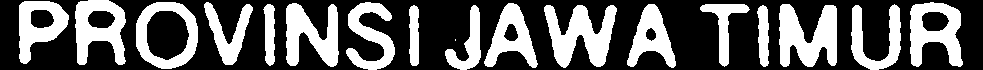

tesseract -  : 
custom result -  : W16hD-NDy171PD-X1


1/1 [==============================] - 0s 32ms/step
model pred idx: 20
model pred conf: 0.9981927275657654
model pred label: A


1/1 [==============================] - 0s 27ms/step
model pred idx: 0
model pred conf: 0.5510299205780029
model pred label: 6


1/1 [==============================] - 0s 25ms/step
model pred idx: 29
model pred conf: 0.9998706579208374
model pred label: P


1/1 [==============================] - 0s 25ms/step
model pred idx: 10
model pred conf: 0.9999710321426392
model pred label: 1


1/1 [==============================] - 0s 24ms/step
model pred idx: 23
model pred conf: 0.6505324244499207
model pred label: -


1/1 [==============================] - 0s 16ms/step
model pred idx: 10
model pred conf: 0.9999145269393921
model pred label: 1


1/1 [==============================] - 0s 16ms/step
model pred idx: 30
model pred conf: 0.9858189821243286
model pred label: X


1/1 [==============================] - 0s 19ms/step
model pred idx: 23
model pred conf: 0.9999995231628418
model pred label: -


1/1 [==============================] - 0s 16ms/step
model pred idx: 16
model pred conf: 0.9997881054878235
model pred label: .


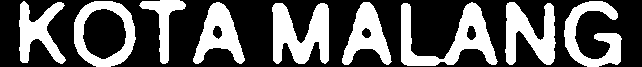

tesseract -  : 
custom result -  : A6P1-1X-.


1/1 [==============================] - 0s 17ms/step
model pred idx: 3
model pred conf: 0.9999786615371704
model pred label: /


1/1 [==============================] - 0s 16ms/step
model pred idx: 5
model pred conf: 0.994705855846405
model pred label: x


1/1 [==============================] - 0s 16ms/step
model pred idx: 7
model pred conf: 0.999997615814209
model pred label: 8


1/1 [==============================] - 0s 17ms/step
model pred idx: 3
model pred conf: 0.9852024912834167
model pred label: /


1/1 [==============================] - 0s 16ms/step
model pred idx: 13
model pred conf: 0.9824973940849304
model pred label: d


1/1 [==============================] - 0s 16ms/step
model pred idx: 2
model pred conf: 0.7618097066879272
model pred label: f


1/1 [==============================] - 0s 16ms/step
model pred idx: 2
model pred conf: 0.7645666599273682
model pred label: f


1/1 [==============================] - 0s 16ms/step
model pred idx: 3
model pred conf: 0.9969725608825684
model pred label: /


1/1 [==============================] - 0s 17ms/step
model pred idx: 13
model pred conf: 0.9516022801399231
model pred label: d


1/1 [==============================] - 0s 16ms/step
model pred idx: 5
model pred conf: 0.9962602853775024
model pred label: x


1/1 [==============================] - 0s 17ms/step
model pred idx: 13
model pred conf: 0.8486384153366089
model pred label: d


1/1 [==============================] - 0s 16ms/step
model pred idx: 3
model pred conf: 0.999617338180542
model pred label: /


1/1 [==============================] - 0s 16ms/step
model pred idx: 13
model pred conf: 0.9759806394577026
model pred label: d


1/1 [==============================] - 0s 17ms/step
model pred idx: 13
model pred conf: 0.9363844990730286
model pred label: d


1/1 [==============================] - 0s 16ms/step
model pred idx: 13
model pred conf: 0.959443986415863
model pred label: d


1/1 [==============================] - 0s 16ms/step
model pred idx: 2
model pred conf: 0.7182077765464783
model pred label: f


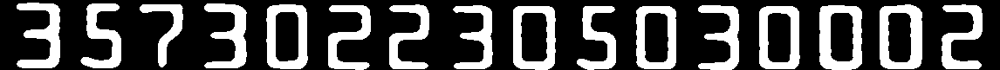

tesseract -  : 
custom result -  : /x8/dff/dxd/dddf


1/1 [==============================] - 0s 18ms/step
model pred idx: 16
model pred conf: 0.988440752029419
model pred label: .


1/1 [==============================] - 0s 16ms/step
model pred idx: 10
model pred conf: 0.9929168224334717
model pred label: 1


1/1 [==============================] - 0s 16ms/step
model pred idx: 24
model pred conf: 0.712532639503479
model pred label: m


1/1 [==============================] - 0s 16ms/step
model pred idx: 10
model pred conf: 0.996065080165863
model pred label: 1


1/1 [==============================] - 0s 19ms/step
model pred idx: 1
model pred conf: 0.999496579170227
model pred label: D


1/1 [==============================] - 0s 16ms/step
model pred idx: 14
model pred conf: 0.9999973773956299
model pred label: 3


1/1 [==============================] - 0s 16ms/step
model pred idx: 21
model pred conf: 0.9998364448547363
model pred label: u


1/1 [==============================] - 0s 17ms/step
model pred idx: 24
model pred conf: 0.7948177456855774
model pred label: m


1/1 [==============================] - 0s 16ms/step
model pred idx: 1
model pred conf: 0.9997276663780212
model pred label: D


1/1 [==============================] - 0s 16ms/step
model pred idx: 23
model pred conf: 0.7577400803565979
model pred label: -


1/1 [==============================] - 0s 16ms/step
model pred idx: 16
model pred conf: 0.2517876625061035
model pred label: .


1/1 [==============================] - 0s 17ms/step
model pred idx: 17
model pred conf: 0.9571342468261719
model pred label: 4


1/1 [==============================] - 0s 17ms/step
model pred idx: 1
model pred conf: 0.9998257756233215
model pred label: D


1/1 [==============================] - 0s 16ms/step
model pred idx: 30
model pred conf: 0.9951582551002502
model pred label: X


1/1 [==============================] - 0s 16ms/step
model pred idx: 20
model pred conf: 0.865104615688324
model pred label: A


1/1 [==============================] - 0s 16ms/step
model pred idx: 23
model pred conf: 0.34391048550605774
model pred label: -


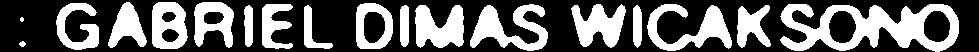

tesseract -  : OIMAS WICAK SONO

custom result -  : .1m1D3umD-.4DXA-


1/1 [==============================] - 0s 17ms/step
model pred idx: 23
model pred conf: 0.6283100247383118
model pred label: -


1/1 [==============================] - 0s 17ms/step
model pred idx: 10
model pred conf: 0.9968869090080261
model pred label: 1


1/1 [==============================] - 0s 16ms/step
model pred idx: 32
model pred conf: 0.6740996241569519
model pred label: 7


1/1 [==============================] - 0s 16ms/step
model pred idx: 2
model pred conf: 0.9949656128883362
model pred label: f


1/1 [==============================] - 0s 17ms/step
model pred idx: 32
model pred conf: 0.5057958364486694
model pred label: 7


1/1 [==============================] - 0s 16ms/step
model pred idx: 22
model pred conf: 0.8351405262947083
model pred label: G


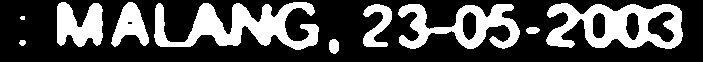

tesseract -  : MALANG, 23-05-2003

custom result -  : -17f7G


1/1 [==============================] - 0s 20ms/step
model pred idx: 24
model pred conf: 0.5789582133293152
model pred label: m


1/1 [==============================] - 0s 16ms/step
model pred idx: 10
model pred conf: 0.9992629885673523
model pred label: 1


1/1 [==============================] - 0s 17ms/step
model pred idx: 24
model pred conf: 0.6793528199195862
model pred label: m


1/1 [==============================] - 0s 16ms/step
model pred idx: 24
model pred conf: 0.5158518552780151
model pred label: m


1/1 [==============================] - 0s 17ms/step
model pred idx: 10
model pred conf: 0.9946183562278748
model pred label: 1


1/1 [==============================] - 0s 19ms/step
model pred idx: 24
model pred conf: 0.6873308420181274
model pred label: m


1/1 [==============================] - 0s 18ms/step
model pred idx: 23
model pred conf: 0.6128591895103455
model pred label: -


1/1 [==============================] - 0s 25ms/step
model pred idx: 17
model pred conf: 0.5561944246292114
model pred label: 4


1/1 [==============================] - 0s 17ms/step
model pred idx: 0
model pred conf: 0.5011870265007019
model pred label: 6


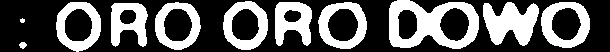

tesseract -  : 
custom result -  : m1mm1m-46


1/1 [==============================] - 0s 17ms/step
model pred idx: 20
model pred conf: 0.9991583824157715
model pred label: A


1/1 [==============================] - 0s 17ms/step
model pred idx: 21
model pred conf: 0.9820718169212341
model pred label: u


1/1 [==============================] - 0s 16ms/step
model pred idx: 24
model pred conf: 0.6695404052734375
model pred label: m


1/1 [==============================] - 0s 16ms/step
model pred idx: 14
model pred conf: 0.9900619983673096
model pred label: 3


1/1 [==============================] - 0s 16ms/step
model pred idx: 23
model pred conf: 0.9999992847442627
model pred label: -


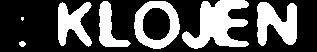

tesseract -  : 
custom result -  : Aum3-


1/1 [==============================] - 0s 17ms/step
model pred idx: 20
model pred conf: 0.9991114735603333
model pred label: A


1/1 [==============================] - 0s 16ms/step
model pred idx: 10
model pred conf: 0.9999382495880127
model pred label: 1


1/1 [==============================] - 0s 17ms/step
model pred idx: 1
model pred conf: 0.9997746348381042
model pred label: D


1/1 [==============================] - 0s 17ms/step
model pred idx: 28
model pred conf: 0.9428472518920898
model pred label: N


1/1 [==============================] - 0s 18ms/step
model pred idx: 29
model pred conf: 0.9935913681983948
model pred label: P


1/1 [==============================] - 0s 17ms/step
model pred idx: 14
model pred conf: 0.9999992847442627
model pred label: 3


1/1 [==============================] - 0s 16ms/step
model pred idx: 23
model pred conf: 1.0
model pred label: -


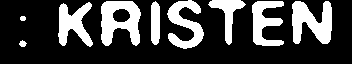

tesseract -  : > KRISTEN

custom result -  : A1DNP3-


1/1 [==============================] - 0s 17ms/step
model pred idx: 28
model pred conf: 0.9673730134963989
model pred label: N


1/1 [==============================] - 0s 16ms/step
model pred idx: 23
model pred conf: 0.9789334535598755
model pred label: -


1/1 [==============================] - 0s 16ms/step
model pred idx: 32
model pred conf: 0.6691132187843323
model pred label: 7


1/1 [==============================] - 0s 19ms/step
model pred idx: 25
model pred conf: 0.9968574047088623
model pred label: W


1/1 [==============================] - 0s 17ms/step
model pred idx: 17
model pred conf: 0.7367857098579407
model pred label: 4


1/1 [==============================] - 0s 18ms/step
model pred idx: 3
model pred conf: 0.8486944437026978
model pred label: /


1/1 [==============================] - 0s 17ms/step
model pred idx: 22
model pred conf: 0.9602559804916382
model pred label: G


1/1 [==============================] - 0s 17ms/step
model pred idx: 22
model pred conf: 0.6138541102409363
model pred label: G


1/1 [==============================] - 0s 18ms/step
model pred idx: 24
model pred conf: 0.7252087593078613
model pred label: m


1/1 [==============================] - 0s 16ms/step
model pred idx: 23
model pred conf: 0.8099625706672668
model pred label: -


1/1 [==============================] - 0s 17ms/step
model pred idx: 11
model pred conf: 0.616557776927948
model pred label: g


1/1 [==============================] - 0s 20ms/step
model pred idx: 14
model pred conf: 0.999997615814209
model pred label: 3


1/1 [==============================] - 0s 17ms/step
model pred idx: 21
model pred conf: 0.9974603652954102
model pred label: u


1/1 [==============================] - 0s 16ms/step
model pred idx: 30
model pred conf: 0.9949730634689331
model pred label: X


1/1 [==============================] - 0s 17ms/step
model pred idx: 23
model pred conf: 0.6227433085441589
model pred label: -


1/1 [==============================] - 0s 17ms/step
model pred idx: 20
model pred conf: 0.9979475140571594
model pred label: A


1/1 [==============================] - 0s 18ms/step
model pred idx: 10
model pred conf: 0.9985846281051636
model pred label: 1


1/1 [==============================] - 0s 17ms/step
model pred idx: 23
model pred conf: 0.8064743876457214
model pred label: -


1/1 [==============================] - 0s 16ms/step
model pred idx: 1
model pred conf: 0.8274953365325928
model pred label: D


1/1 [==============================] - 0s 17ms/step
model pred idx: 23
model pred conf: 0.9999843835830688
model pred label: -


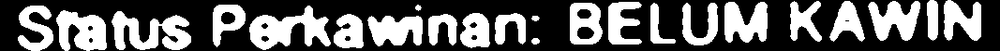

tesseract -  : 
custom result -  : N-7W4/GGm-g3uX-A1-D-


1/1 [==============================] - 0s 17ms/step
model pred idx: 20
model pred conf: 0.9758281111717224
model pred label: A


1/1 [==============================] - 0s 17ms/step
model pred idx: 24
model pred conf: 0.8075915575027466
model pred label: m


1/1 [==============================] - 0s 17ms/step
model pred idx: 29
model pred conf: 0.9998621940612793
model pred label: P


1/1 [==============================] - 0s 17ms/step
model pred idx: 10
model pred conf: 0.9999880790710449
model pred label: 1


1/1 [==============================] - 0s 17ms/step
model pred idx: 23
model pred conf: 0.6580348610877991
model pred label: -


1/1 [==============================] - 0s 17ms/step
model pred idx: 10
model pred conf: 0.999423623085022
model pred label: 1


1/1 [==============================] - 0s 17ms/step
model pred idx: 30
model pred conf: 0.9991337656974792
model pred label: X


1/1 [==============================] - 0s 16ms/step
model pred idx: 23
model pred conf: 0.999146580696106
model pred label: -


1/1 [==============================] - 0s 16ms/step
model pred idx: 24
model pred conf: 0.7474130392074585
model pred label: m


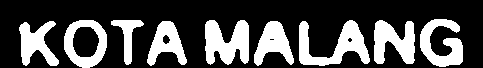

tesseract -  : KOTA MALANG

custom result -  : AmP1-1X-m


1/1 [==============================] - 0s 17ms/step
model pred idx: 20
model pred conf: 0.9698827266693115
model pred label: A


1/1 [==============================] - 0s 16ms/step
model pred idx: 22
model pred conf: 0.9011659622192383
model pred label: G


1/1 [==============================] - 0s 16ms/step
model pred idx: 25
model pred conf: 0.28601402044296265
model pred label: W


1/1 [==============================] - 0s 16ms/step
model pred idx: 22
model pred conf: 0.974332332611084
model pred label: G


1/1 [==============================] - 0s 16ms/step
model pred idx: 12
model pred conf: 0.5647202134132385
model pred label: 2


1/1 [==============================] - 0s 16ms/step
model pred idx: 24
model pred conf: 0.9731597900390625
model pred label: m


1/1 [==============================] - 0s 16ms/step
model pred idx: 24
model pred conf: 0.5381031036376953
model pred label: m


1/1 [==============================] - 0s 20ms/step
model pred idx: 23
model pred conf: 0.902637779712677
model pred label: -


1/1 [==============================] - 0s 17ms/step
model pred idx: 17
model pred conf: 0.8208727836608887
model pred label: 4


1/1 [==============================] - 0s 22ms/step
model pred idx: 1
model pred conf: 0.9981961846351624
model pred label: D


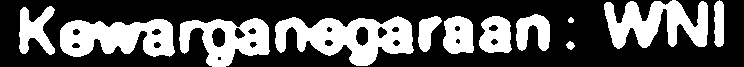

tesseract -  : Kewarganegaraan: WNI

custom result -  : AGWG2mm-4D


1/1 [==============================] - 0s 16ms/step
model pred idx: 28
model pred conf: 0.9721850752830505
model pred label: N


1/1 [==============================] - 0s 16ms/step
model pred idx: 14
model pred conf: 0.9999998807907104
model pred label: 3


1/1 [==============================] - 0s 17ms/step
model pred idx: 32
model pred conf: 0.8126153349876404
model pred label: 7


1/1 [==============================] - 0s 17ms/step
model pred idx: 30
model pred conf: 0.9979786276817322
model pred label: X


1/1 [==============================] - 0s 17ms/step
model pred idx: 10
model pred conf: 0.9995208978652954
model pred label: 1


1/1 [==============================] - 0s 17ms/step
model pred idx: 17
model pred conf: 0.9999673366546631
model pred label: 4


1/1 [==============================] - 0s 17ms/step
model pred idx: 1
model pred conf: 0.9822238087654114
model pred label: D


1/1 [==============================] - 0s 16ms/step
model pred idx: 13
model pred conf: 0.7107728719711304
model pred label: d


1/1 [==============================] - 0s 16ms/step
model pred idx: 30
model pred conf: 0.9976748824119568
model pred label: X


1/1 [==============================] - 0s 16ms/step
model pred idx: 25
model pred conf: 0.9740017056465149
model pred label: W


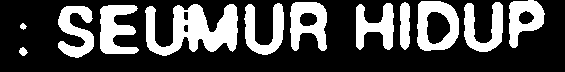

tesseract -  : : SEUMUR HIDUP

custom result -  : N37X14DdXW


1/1 [==============================] - 0s 29ms/step
model pred idx: 12
model pred conf: 0.48416098952293396
model pred label: 2


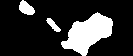

tesseract -  : yf

custom result -  : 2


In [31]:
import pytesseract

for roi in ktp_roi:
  # padded = cv2.copyMakeBorder(roi, 12, 12, 12, 12, cv2.BORDER_CONSTANT)
  text_roi = grab_text(roi.copy(),-1)
  pred = get_text_roi(text_roi)
  extractedInformation = pytesseract.image_to_string(text_roi)
  cv2_imshow(text_roi)
  print(f"tesseract -  : {extractedInformation}")
  print(f"custom result -  : {''.join(pred)}")


In [32]:
!sudo apt install tesseract-ocr
!pip install pytesseract

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
tesseract-ocr is already the newest version (4.1.1-2.1build1).
0 upgraded, 0 newly installed, 0 to remove and 24 not upgraded.
